<a href="https://colab.research.google.com/github/fernandoGitHub/ML_Projects/blob/main/Residual_Networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Residual Networks

Residual Networks, introduced by [He et al.](https://arxiv.org/pdf/1512.03385.pdf), allow you to train much deeper networks than were previously feasible.

**In this hands on we will:**

- Implement the basic building blocks of ResNets in a deep neural network using Keras - DONE
- Put together these building blocks to implement and train a state-of-the-art neural network for image classification - DONE
- Implement a skip connection in your network - DONE
- Train the net using CPU and GPU and compare times - DONE
- Run batch inference - DONE
- Run single inference using model function - DONE
- Test different network sizes - DONE
- Test different shortcuts lengths - DONE


# 1 - Packages

In [1]:
import numpy as np
import pandas as pd
import scipy.misc
import os
import h5py
import math

import matplotlib.pyplot as plt
%matplotlib inline

import PIL

import tensorflow as tf
import tensorflow.keras.layers as tfl
import tensorflow.keras.initializers as tfi
import tensorflow.keras.preprocessing as tfp
import tensorflow.keras.models as tfm

In [2]:
# Installing packages without !pip

import sys
import subprocess as sp
import pkg_resources

def install_package(package, reload = True):
  # Veryfing existing install prior to install
  if is_installed(package):
    print (f'Package: {package} is already installed. Skipping installation')
  else:
    print(f'Installing {package} ...')
    sp.check_call([sys.executable, '-m', 'pip', 'install', package])
    print(f'Package {package} has been successfully installed')

  if reload:
    reload_packages()

def is_installed (package):
  # Getting all the list of packages
  return (package in get_installed_packages())

def get_installed_packages():
  return sorted({pkg.key for pkg in pkg_resources.working_set})

def reload_packages():
  print ('Reloading Packages')
  import pkg_resources
  import importlib
  importlib.reload(pkg_resources)

In [3]:
# Enabling Multi-output on Notebook cells
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# 2 - Resnet Blocks

## `2.1 - Identity Block`

In [4]:
def identity_block(X, filters, kernel_size, training=True, initializer=tfi.random_uniform):
    """
    Implementation of the Residual Block (any number of skips)

    Assumptions:
    1. The kernel size is constant along the block but it is equal to 1 at the input and output layers
    2. The padding follows the same principle - 'same' for all layers but 'valid' for the input and output layers
    3. strides equal to (1,1) for all layers besides the first and shortcut layers

    Arguments:
    X           -- Input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    filters     -- List of integers, defining the number of filters in the CONV layers of the main path
    kernel_size -- Shape of the filters used in the internal layers
    training    -- True: Behave in training mode
                   False: Behave in inference mode
    initializer -- To set up the initial weights of a layer. Equals to random uniform initializer
    
    Returns:
    X           -- output of the identity block, tensor of shape (m, n_H, n_W, n_C)
    """
    
    # Size of convolutions in main path
    L = len(filters) 
    
    # Save previous output for later addition 
    X_shortcut = X
    
    # First block
    X = tfl.Conv2D(filters = filters[0], kernel_size = 1, strides=(1,1), padding='valid', kernel_initializer=initializer(seed=0))(X)
    X = tfl.BatchNormalization(axis=3)(X, training=training)
    X = tfl.Activation('relu')(X)

    # Adding internal blocks
    for i in range(1, L-1):
      X = tfl.Conv2D(filters = filters[i], kernel_size=kernel_size, strides=(1,1), padding='same', kernel_initializer=initializer(seed=0))(X)
      X = tfl.BatchNormalization(axis=3)(X, training=training)
      X = tfl.Activation('relu')(X)

    ## Last component of the block receives the output of the previous block before activating
    X = tfl.Conv2D(filters = filters[L-1], kernel_size=1, strides=(1,1), padding='valid', kernel_initializer=initializer(seed=0))(X)
    X = tfl.BatchNormalization(axis=3)(X, training=training) 
    X = tfl.Add()([X, X_shortcut])
    X = tfl.Activation('relu')(X) 

    # Unitest
    assert X_shortcut.shape[1:3] == X.shape[1:3], f'The shapes of the input and output differ! Input shape: {X_shortcut.shape} <> Output shape: {X.shape}'

    return X

## 2.2 - The Convolutional Block

In [5]:
def convolutional_block(X, filters, kernel_size, stride, training=True, initializer=tfi.glorot_uniform):
    """
    Implementation of the convolutional block
    Assumptions:
    1. The kernel size is constant along the block but it is equal to 1 at the shortcut, input and output layers
    2. The padding follows the same principle - 'same' for all layers but 'valid' for the shortcut, input and output layers
    3. strides equal to (1,1) for all layers besides input and shortcut layers
    4. shape/size of the input and output layers are the same
    
    Arguments:
    X           -- Input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    filters     -- Python list of integers, defining the number of filters in the CONV layers of the main path
    kernel_size -- Shape of the filters used in the internal layers
    stride      -- Stride used in the input and shortcut layers
    training    -- True: Behave in training mode
                   False: Behave in inference mode
    initializer -- To set up the initial weights of a layer. Equals to random uniform initializer
    
    Returns:
    X           -- output of the identity block, tensor of shape (m, n_H, n_W, n_C)
    """
    
    # Size of convolutions in main path
    L = len(filters) 
    
    # Save previous output for later addition 
    X_shortcut = X
    
    # MAIN PATH #
    # First Block
    X = tfl.Conv2D(filters = filters[0], kernel_size=1, strides=(stride,stride), padding='valid', kernel_initializer=initializer(seed=0))(X)
    X = tfl.BatchNormalization(axis=3)(X, training=training)
    X = tfl.Activation('relu')(X)   
    
    # Internal Layers
    for i in range(1, L-1):
      X = tfl.Conv2D(filters = filters[i], kernel_size=kernel_size, strides=(1,1), padding='same', kernel_initializer=initializer(seed=0))(X)
      X = tfl.BatchNormalization(axis=3)(X, training=training)
      X = tfl.Activation('relu')(X)

    ## Last component of the block - receives the input for the first one before activation
    X = tfl.Conv2D(filters = filters[L-1], kernel_size=1, strides=(1,1), padding='valid', kernel_initializer=initializer(seed=0))(X)
    X = tfl.BatchNormalization(axis=3)(X, training=training) 

    # SHORTCUT PATH # 
    X_shortcut = tfl.Conv2D(filters = filters[L-1], kernel_size=1, strides=(stride,stride), padding='valid', kernel_initializer=initializer(seed=0))(X_shortcut)
    X_shortcut = tfl.BatchNormalization(axis=3)(X_shortcut, training=training) 

    # Final step
    X = tfl.Add()([X, X_shortcut])
    X = tfl.Activation('relu')(X)
    
    return X

## 2.3 - ResNet (50 layers) - V1.0

Let's play with a basic ResNet according to the following figure (source: Coursera, DeepLearning.ai)
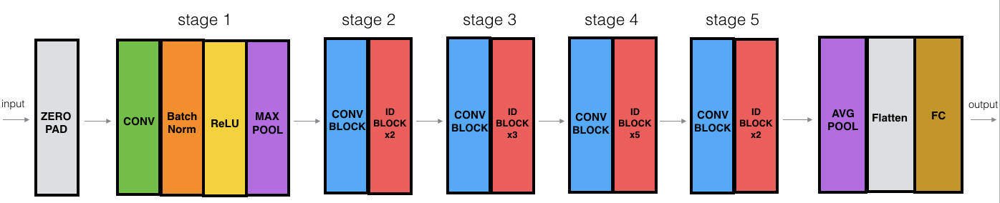
<caption><center> <u> <font color='purple'> <b>Figure 5</b> </u><font color='purple'>  : <b>ResNet-50 model</b> </center></caption>

In [6]:
def ResNet50_v1(input_shape = (64, 64, 3), classes = 6):
    """
    Stage-wise implementation of the architecture of the popular ResNet50 - Version 1.0:
    CONV2D -> BATCHNORM -> RELU -> MAXPOOL -> CONVBLOCK -> IDBLOCK*2 -> CONVBLOCK -> IDBLOCK*3
    -> CONVBLOCK -> IDBLOCK*5 -> CONVBLOCK -> IDBLOCK*2 -> AVGPOOL -> FLATTEN -> DENSE 

    Arguments:
    input_shape -- shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """
    
    # Define the input as a tensor with shape input_shape
    X_input = tfl.Input(input_shape)
 
    # Zero-Padding
    X = tfl.ZeroPadding2D((3, 3))(X_input)
    
    # Stage 1
    X = tfl.Conv2D(64, (7, 7), strides = (2, 2), kernel_initializer = tfi.glorot_uniform(seed=0))(X)
    X = tfl.BatchNormalization(axis = 3)(X, training=True)
    X = tfl.Activation('relu')(X)
    X = tfl.MaxPooling2D((3, 3), strides=(2, 2))(X)

    kernel_size = 3
    filters = [64, 64, 256]
    stride_conv = 1

    # Stage 2
    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv)
    for i in range(2):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)
    
    ## Stage 3 
    filters = np.multiply(filters, 2)
    stride_conv = 2

    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv) 
    for i in range(3):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)  
    
    ## Stage 4 
    filters = np.multiply(filters, 2)

    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv)
    for i in range(5): 
      X = identity_block(X, kernel_size=kernel_size, filters=filters) 

    ## Stage 5 (≈3 lines)
    filters = np.multiply(filters, 2)
    
    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv) 
    for i in range(2):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)  

    X = tfl.AveragePooling2D(pool_size=(2, 2))(X) 

    # output layer
    X = tfl.Flatten()(X)
    X = tfl.Dense(classes, activation='softmax', kernel_initializer = tfi.glorot_uniform(seed=0))(X)
    
    # Create model
    model = tfm.Model(inputs = X_input, outputs = X)

    return model

In [7]:
resnet50_v1_0 = ResNet50_v1(input_shape = (64, 64, 3), classes = 6)
print(resnet50_v1_0.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 70, 70, 3)   0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 64)   9472        ['zero_padding2d[0][0]']         
                                                                                                  
 batch_normalization (BatchNorm  (None, 32, 32, 64)  256         ['conv2d[0][0]']                 
 alization)                                                                                   

In [8]:
resnet50_v1_0.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# 3 - Preparing and Loading a Dataset

The model is now ready to be trained. The only thing you need now is a dataset!

Let's use the fingers dataset for training.

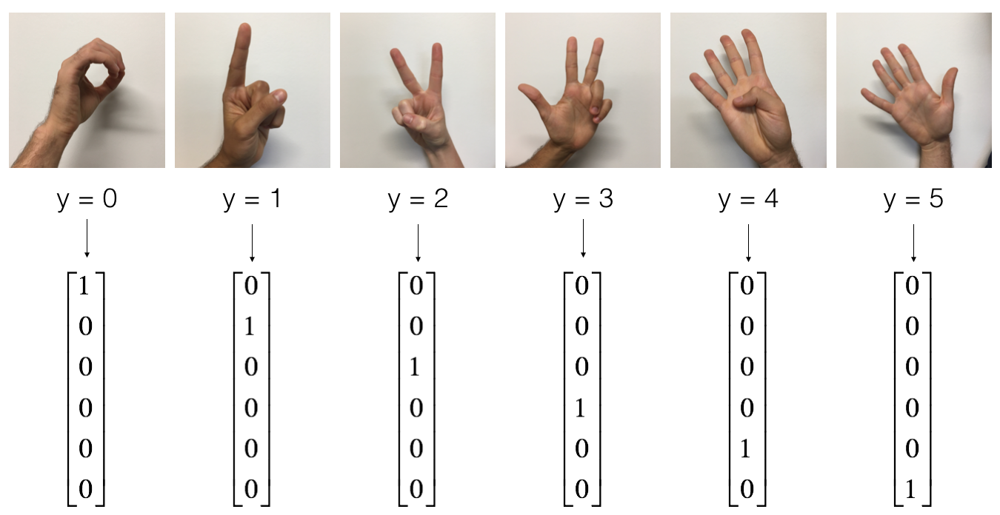

In [9]:
import os
import shutil

install_package('wget')
import wget

_DATASETS_DIR = './datasets'
_TRAIN_FILENAME = 'train_signs.h5'
_TEST_FILENAME = 'test_signs.h5'

_GITHUB_DIR_URL = 'https://github.com/fernandoGitHub/ML_Projects/raw/main/Residual_Networks/data/'
_TRAIN_URL_PATH = os.path.join(_GITHUB_DIR_URL, _TRAIN_FILENAME)
_TEST_URL_PATH =  os.path.join(_GITHUB_DIR_URL, _TEST_FILENAME)

_TRAIN_FULL_PATH = os.path.join(_DATASETS_DIR, _TRAIN_FILENAME)
_TEST_FULL_PATH =  os.path.join(_DATASETS_DIR, _TEST_FILENAME)

if os.path.isdir('./sample_data'):
  shutil.rmtree('./sample_data')
  print('Removing default sample_data directory...')

if os.path.isdir(_DATASETS_DIR):
  shutil.rmtree(_DATASETS_DIR)
  print(f'Removing old {_DATASETS_DIR} directory...')

if not os.path.isdir(_DATASETS_DIR):
  os.makedirs(_DATASETS_DIR)
  print(f'Recreating {_DATASETS_DIR} directory...')

if not os.path.isfile(_TRAIN_FULL_PATH):
  file_name = wget.download(_TRAIN_URL_PATH)
  print(f"Fetching from GitHub: {_TRAIN_FILENAME} ...")
  os.replace(os.path.join('.', _TRAIN_FILENAME), _TRAIN_FULL_PATH)

if not os.path.isfile(_TEST_FULL_PATH):
  file_name = wget.download(_TEST_URL_PATH)
  print(f"Fetching from GitHub: {_TEST_FILENAME} ...")
  os.replace(os.path.join('.', _TEST_FILENAME), _TEST_FULL_PATH)

Installing wget ...
Package wget has been successfully installed
Reloading Packages
Removing default sample_data directory...
Recreating ./datasets directory...
Fetching from GitHub: train_signs.h5 ...
Fetching from GitHub: test_signs.h5 ...


In [10]:
def convert_to_one_hot(Y, C):
  Y = np.eye(C)[Y.reshape(-1)].T
  return Y

def load_dataset(train_filename, test_filename, normalize=True, one_hot_conversion = True, display=True):
  # Train Set
  train_dataset = h5py.File(train_filename, "r")
  X_train = np.array(train_dataset["train_set_x"][:])  
  Y_train = np.array(train_dataset["train_set_y"][:])
  Y_train = Y_train.reshape((1, Y_train.shape[0]))

  # Test Set
  test_dataset = h5py.File(test_filename, "r")
  X_test = np.array(test_dataset["test_set_x"][:])   
  Y_test = np.array(test_dataset["test_set_y"][:])
  Y_test = Y_test.reshape((1, Y_test.shape[0]))

  classes = np.array(test_dataset["list_classes"][:])

  if normalize:
    X_train = X_train / 255.
    X_test  = X_test / 255.

  # Convert training and test labels to one hot matrices
  if one_hot_conversion:
    Y_train = convert_to_one_hot(Y_train, 6).T
    Y_test  = convert_to_one_hot(Y_test, 6).T

  if display:
    print ("number of training examples = " + str(X_train.shape[0]))
    print ("number of test examples = " + str(X_test.shape[0]))
    print ("X_train shape: " + str(X_train.shape))
    print ("Y_train shape: " + str(Y_train.shape))
    print ("X_test shape: " + str(X_test.shape))
    print ("Y_test shape: " + str(Y_test.shape))

    return X_train, Y_train, X_test, Y_test, classes

In [11]:
X_train, Y_train, X_test, Y_test, classes = load_dataset(_TRAIN_FULL_PATH, _TEST_FULL_PATH)

number of training examples = 1080
number of test examples = 120
X_train shape: (1080, 64, 64, 3)
Y_train shape: (1080, 6)
X_test shape: (120, 64, 64, 3)
Y_test shape: (120, 6)


In [12]:
def display_images(images, index, labels=None, scale=False): 
  for i in index:
    x = images[i,:,:,:]
    if scale:
      x = x/255.0

    min_value =  str(np.round(np.min(x), 3))
    max_value =  str(np.round(np.max(x), 3))
    mean_value = str(np.round(np.mean(x), 3))
    print(f'Input no: {i} - image shape: {x.shape} - (min, max, mean) = ({min_value}, {max_value}, {mean_value})')
    
    if type(labels) != type(None):
      print(f"Label: {labels[i]}")

    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(12,4))
    ax[0].imshow(x)
    ax[0].set_title('RGB channels')
    ax[1].imshow(x[:, :, 0])
    ax[1].set_title('R channel')
    ax[2].imshow(x[:, :, 1])
    ax[2].set_title('G channel')
    ax[3].imshow(x[:, :, 2])
    ax[3].set_title('B channel')
    plt.show()
    print('\n')

Input no: 752 - image shape: (64, 64, 3) - (min, max, mean) = (0.137, 0.914, 0.739)
Label: [0. 0. 1. 0. 0. 0.]


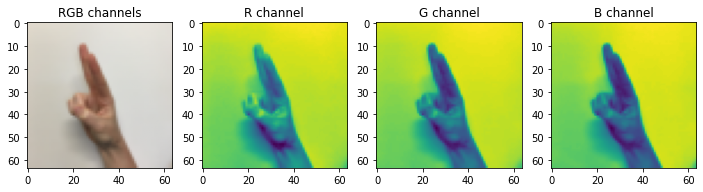



Input no: 922 - image shape: (64, 64, 3) - (min, max, mean) = (0.09, 0.914, 0.73)
Label: [0. 0. 0. 0. 0. 1.]


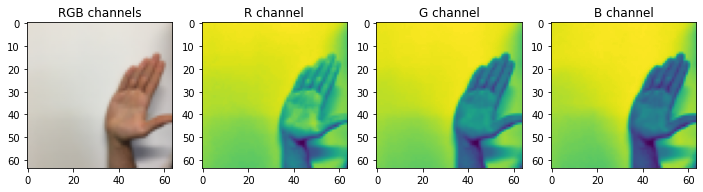



Input no: 401 - image shape: (64, 64, 3) - (min, max, mean) = (0.098, 0.922, 0.727)
Label: [1. 0. 0. 0. 0. 0.]


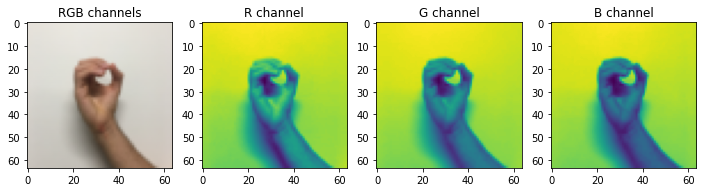



Input no: 975 - image shape: (64, 64, 3) - (min, max, mean) = (0.106, 0.925, 0.725)
Label: [0. 0. 1. 0. 0. 0.]


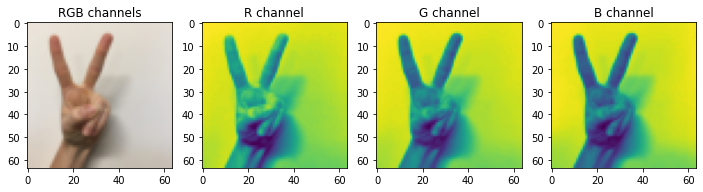



Input no: 174 - image shape: (64, 64, 3) - (min, max, mean) = (0.043, 0.918, 0.729)
Label: [0. 1. 0. 0. 0. 0.]


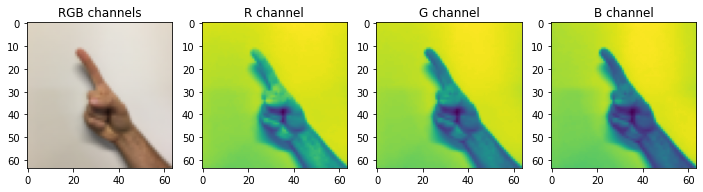

In [13]:
display_images(images=X_train, index=np.random.randint(low=0, high=len(X_train), size=5, dtype=int), labels=Y_train)

Training on a CPU will require ~150 seconds per batch; on a GPU it takes about ~2 seconds per batch!! (x75 improve in speed) 

In [14]:
resnet50_v1_0.fit(X_train, Y_train, epochs = 40, batch_size = 32)

Epoch 1/40
34/34 [==============================] - 26s 82ms/step - loss: 1.8646 - accuracy: 0.4731
Epoch 2/40
34/34 [==============================] - 2s 56ms/step - loss: 0.5838 - accuracy: 0.8093
Epoch 3/40
34/34 [==============================] - 2s 55ms/step - loss: 0.3410 - accuracy: 0.8898
Epoch 4/40
34/34 [==============================] - 2s 55ms/step - loss: 0.3369 - accuracy: 0.8972
Epoch 5/40
34/34 [==============================] - 2s 55ms/step - loss: 0.1332 - accuracy: 0.9546
Epoch 6/40
34/34 [==============================] - 2s 55ms/step - loss: 0.2460 - accuracy: 0.9269
Epoch 7/40
34/34 [==============================] - 2s 56ms/step - loss: 0.2035 - accuracy: 0.9444
Epoch 8/40
34/34 [==============================] - 2s 56ms/step - loss: 0.3191 - accuracy: 0.9120
Epoch 9/40
34/34 [==============================] - 2s 56ms/step - loss: 0.2735 - accuracy: 0.9352
Epoch 10/40
34/34 [==============================] - 2s 55ms/step - loss: 0.2040 - accuracy: 0.9370
Epoch 11

Let's see how version 1.0 trained on 10 epochs performs on the test set.

In [15]:
preds = resnet50_v1_0.evaluate(X_test, Y_test)
print ("Loss = " + str(preds[0]))
print ("Test Accuracy = " + str(preds[1]))

4/4 [==============================] - 1s 35ms/step - loss: 0.1378 - accuracy: 0.9750
Loss = 0.13779231905937195
Test Accuracy = 0.9750000238418579


In [16]:
Y_pred = resnet50_v1_0.predict(X_test)

In [17]:
matrix = tf.math.confusion_matrix(Y_test.argmax(axis=1), Y_pred.argmax(axis=1))

In [18]:
matrix_df = pd.DataFrame(matrix.numpy(), columns=['Pred_'+str(i) for i in range(6)], index=['Real_'+str(i) for i in range(6)])
matrix_df.head()

,Pred_0,Pred_1,Pred_2,Pred_3,Pred_4,Pred_5
Real_0,20,0,0,0,0,0
Real_1,0,20,0,0,0,0
Real_2,0,1,19,0,0,0
Real_3,0,0,0,20,0,0
Real_4,0,0,0,1,18,1


Saving the model (imperative as training takes a long time)

In [19]:
_MODELS_DIR = './models'
_MODEL_FILENAME = 'Resnet50_v1_0.h5'

_MODEL_FULL_PATH = os.path.join(_MODELS_DIR, _MODEL_FILENAME)

if not os.path.isdir(_MODELS_DIR):
  os.makedirs(_MODELS_DIR)

if os.path.isfile(_MODEL_FULL_PATH):
  os.remove(_MODEL_FULL_PATH)

print(f"Saving the model to disk as: {_MODEL_FULL_PATH} ...")
resnet50_v1_0.save(_MODEL_FULL_PATH, save_format='h5')

Saving the model to disk as: ./models/Resnet50_v1_0.h5 ...


# 4 - Testing the Network

Let's predict results for the train dataset

In [20]:
_MODEL_FULL_PATH = './models/Resnet50_v1_0.h5'
resnet50_v1_0 = tf.keras.models.load_model(_MODEL_FULL_PATH)

In [21]:
# Adding some pictures from X_train
_IMAGES_DIR = './images'
if not os.path.isdir(_IMAGES_DIR):
  os.makedirs(_IMAGES_DIR)

for index in np.random.randint(low=0, high=len(X_train), size=20, dtype=int):
  im = PIL.Image.fromarray((X_train[index] * 255).astype(np.uint8))
  path = os.path.join('./images', 'Train'+str(index)+".JPG")
  im.save(path)

In [22]:
def load_and_preprocess_images_from_directory(img_dir, normalize=True, display=True):
  #shutil.rmtree('./images/.ipynb_checkpoints')
  files = os.listdir(img_dir)
  JPGs = [file for file in files if (file.endswith(".jpg") or file.endswith(".JPG"))]

  images = []
  for file in files:
    img_path = os.path.join(img_dir, file)
    img = tfp.image.load_img(img_path, target_size=(64, 64))
    x = tfp.image.img_to_array(img)

    if normalize:
      x = x/255.0
  
    x = np.expand_dims(x, axis=0)
    x = np.array(x)
    if display:
      print(f"\033[1mImage Name: {file}\033[0m")
      display_images(images=x, index=[0], scale=False)

    images.append((x, file))

  return images

Image Name: Train573.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.996, 0.731)


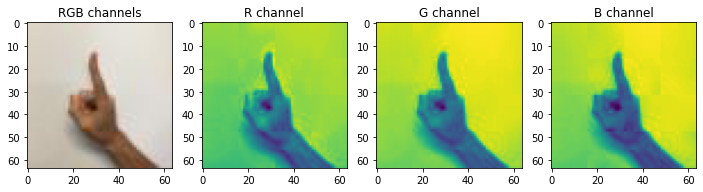



Image Name: Train955.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.941, 0.736)


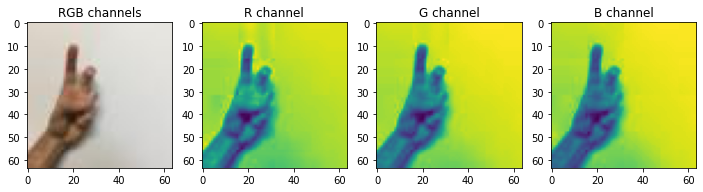



Image Name: Train161.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.031, 0.996, 0.713)


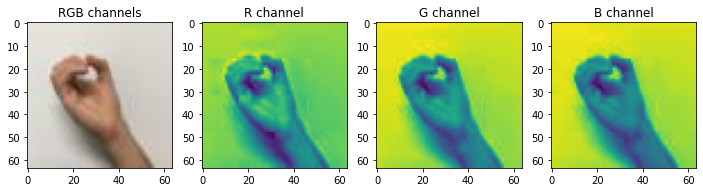



Image Name: Train511.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 1.0, 0.639)


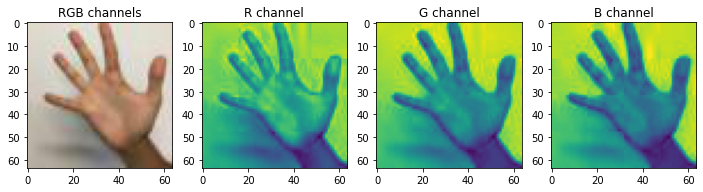



Image Name: Train231.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.937, 0.74)


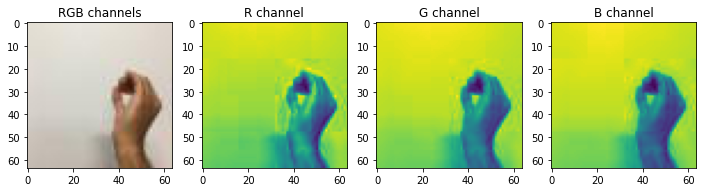



Image Name: Train309.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.075, 1.0, 0.685)


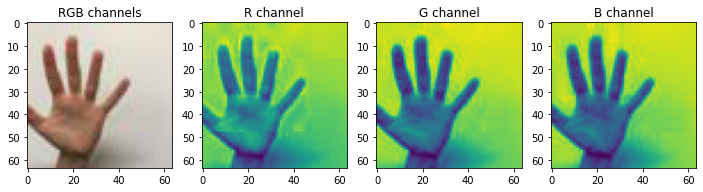



Image Name: Train1059.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 0.992, 0.715)


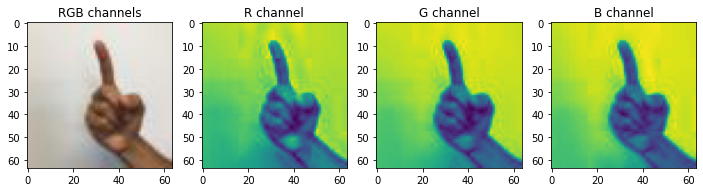



Image Name: Train821.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.008, 0.945, 0.713)


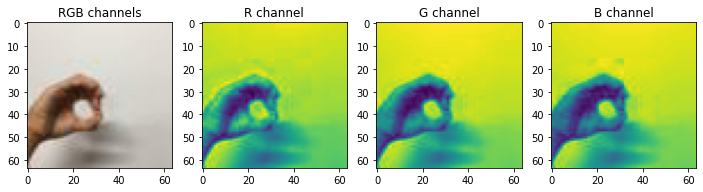



Image Name: Train61.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.027, 1.0, 0.714)


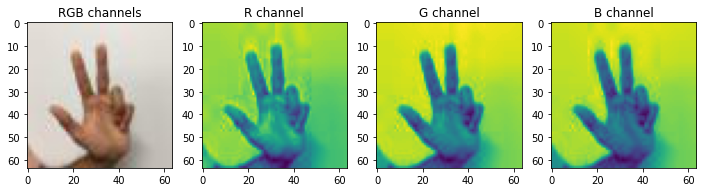



Image Name: Train800.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 0.925, 0.708)


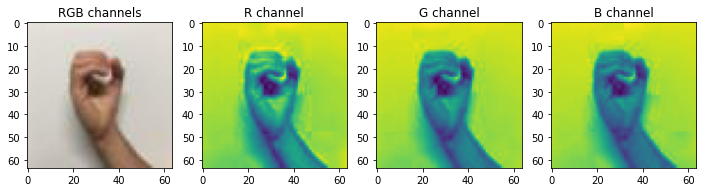



Image Name: Train984.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.027, 1.0, 0.696)


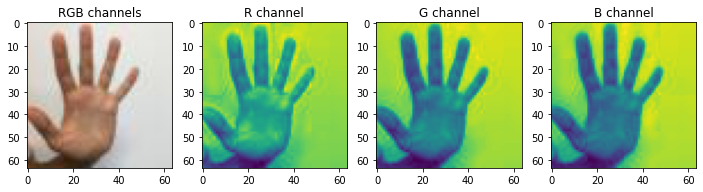



Image Name: Train183.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 1.0, 0.681)


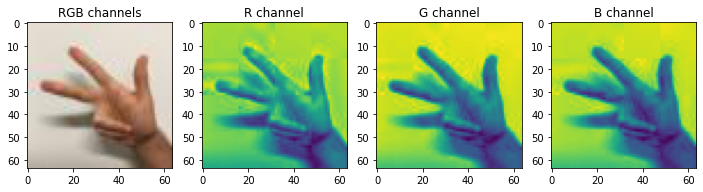



Image Name: Train447.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.008, 0.984, 0.672)


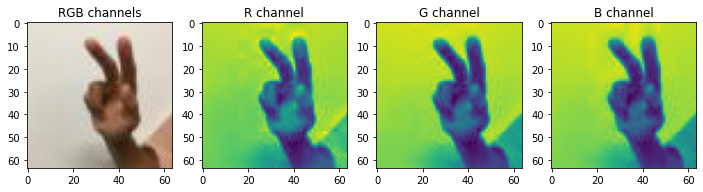



Image Name: Train190.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.09, 0.996, 0.719)


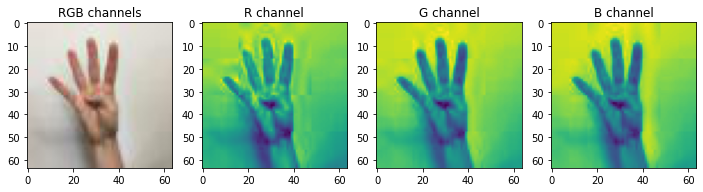



Image Name: Train715.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.055, 0.953, 0.739)


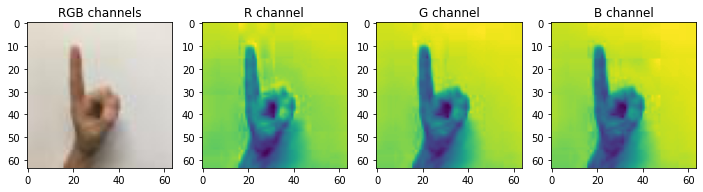



Image Name: Train1023.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.059, 0.953, 0.728)


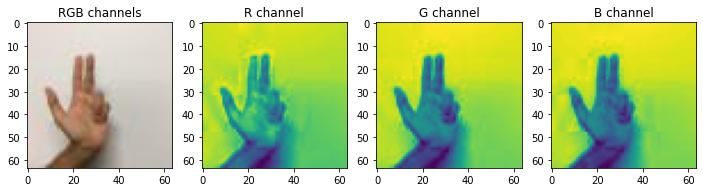



Image Name: Train212.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 0.992, 0.678)


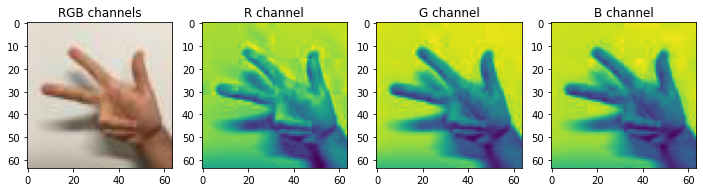



Image Name: Train985.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.91, 0.719)


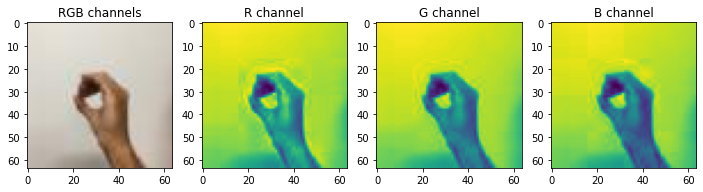



Image Name: Train1008.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 1.0, 0.721)


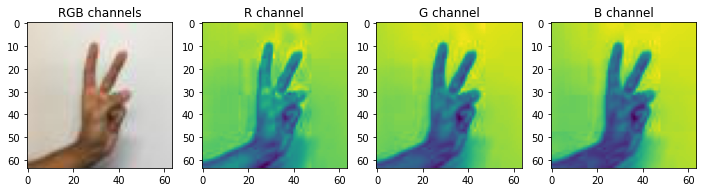



Image Name: Train440.JPG
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 0.973, 0.735)


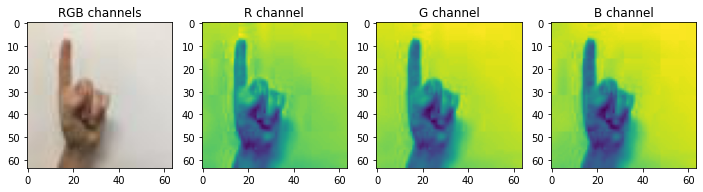

In [23]:
images = load_and_preprocess_images_from_directory(img_dir=_IMAGES_DIR)

In [24]:
def batch_predict_images(model, images, display=True):
  predictions = []
  X_test = [np.squeeze(X_image, axis=0) for i, (X_image, image_name) in enumerate(images)]
  X_names = [image_name for i, (X_image, image_name) in enumerate(images)]

  X_test = np.array(X_test)
  predictions = model.predict(X_test)
  predictions = np.round(predictions, 3)

  for i in range(X_test.shape[0]):
    if display:
      print(f"\033[1mImage Name: {X_names[i]}\033[0m")
      print(f"Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = {predictions[i]}")
      predicted_class = np.argmax(predictions[i])
      print(f"Predicted Class: {predicted_class}")
      display_images(images=np.expand_dims(X_test[i], axis=0), index=[0], scale=False)

  return predictions

Image Name: Train573.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 1. 0. 0. 0. 0.]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.996, 0.731)


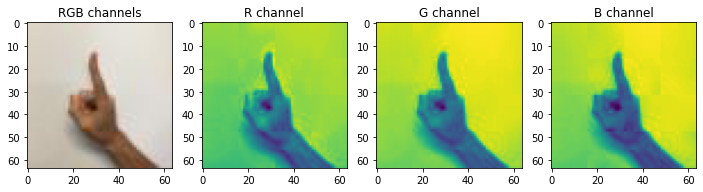



Image Name: Train955.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 1. 0. 0. 0.]
Predicted Class: 2
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.941, 0.736)


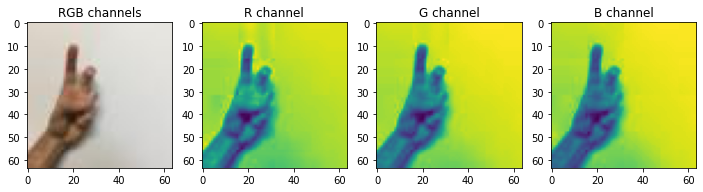



Image Name: Train161.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [1. 0. 0. 0. 0. 0.]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.031, 0.996, 0.713)


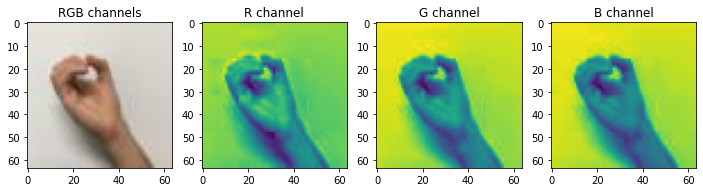



Image Name: Train511.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 0. 0. 0. 1.]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 1.0, 0.639)


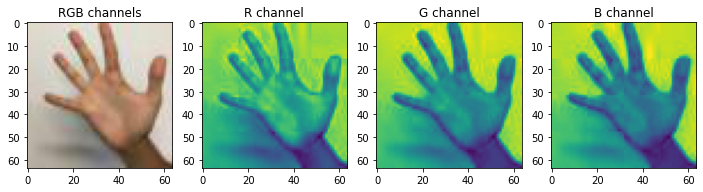



Image Name: Train231.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0.998 0.    0.    0.    0.001 0.   ]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.937, 0.74)


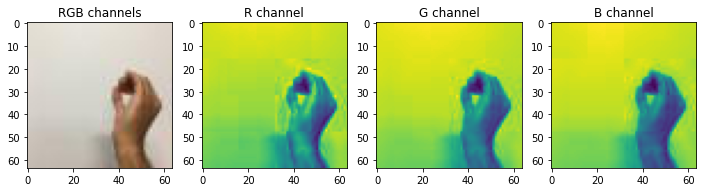



Image Name: Train309.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 0. 0. 0. 1.]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.075, 1.0, 0.685)


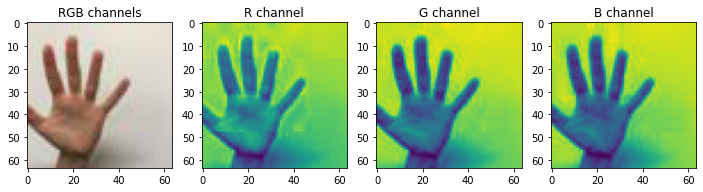



Image Name: Train1059.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 1. 0. 0. 0. 0.]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 0.992, 0.715)


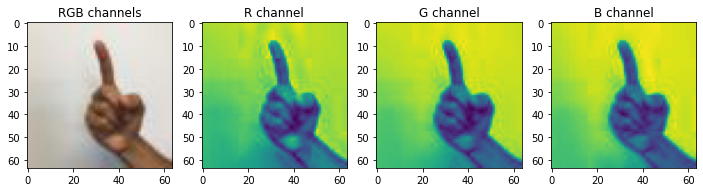



Image Name: Train821.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [1. 0. 0. 0. 0. 0.]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.008, 0.945, 0.713)


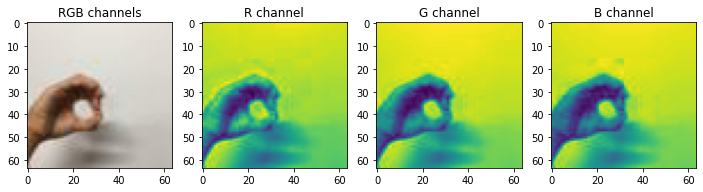



Image Name: Train61.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 0. 1. 0. 0.]
Predicted Class: 3
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.027, 1.0, 0.714)


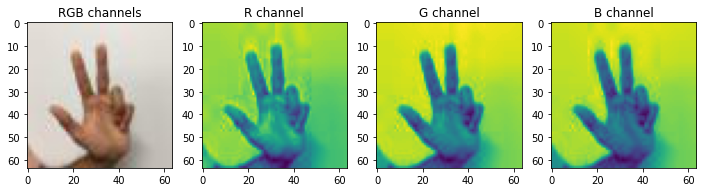



Image Name: Train800.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [1. 0. 0. 0. 0. 0.]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 0.925, 0.708)


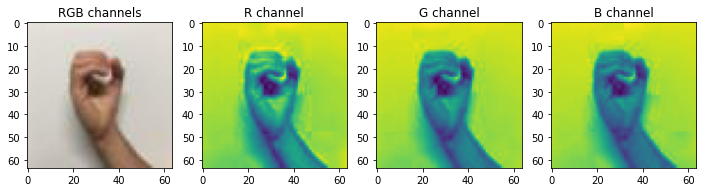



Image Name: Train984.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 0. 0. 0. 1.]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.027, 1.0, 0.696)


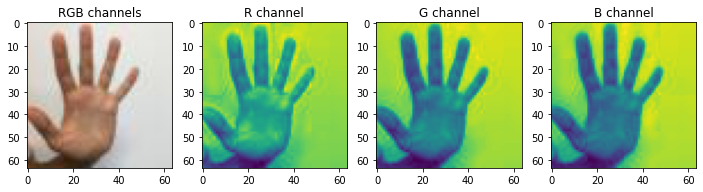



Image Name: Train183.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 0. 1. 0. 0.]
Predicted Class: 3
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 1.0, 0.681)


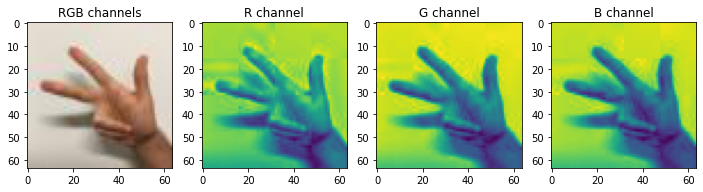



Image Name: Train447.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0.006 0.037 0.004 0.906 0.047 0.   ]
Predicted Class: 3
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.008, 0.984, 0.672)


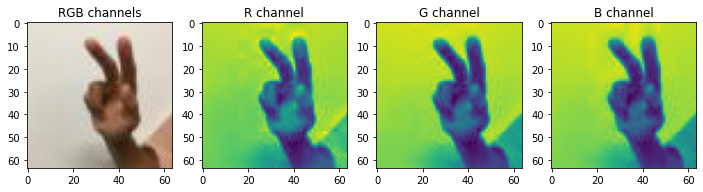



Image Name: Train190.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 0. 0. 1. 0.]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.09, 0.996, 0.719)


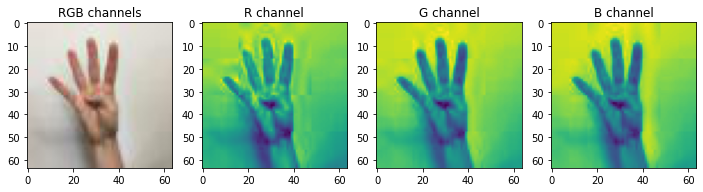



Image Name: Train715.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 1. 0. 0. 0. 0.]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.055, 0.953, 0.739)


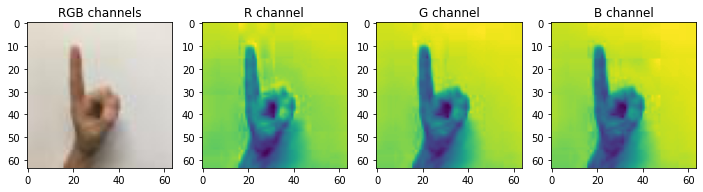



Image Name: Train1023.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 0. 1. 0. 0.]
Predicted Class: 3
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.059, 0.953, 0.728)


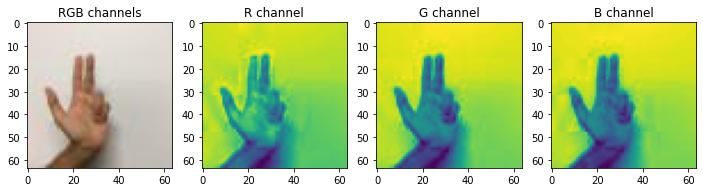



Image Name: Train212.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 0. 1. 0. 0.]
Predicted Class: 3
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 0.992, 0.678)


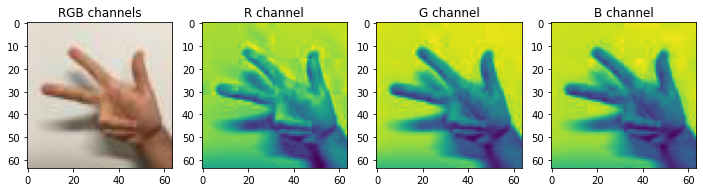



Image Name: Train985.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [1. 0. 0. 0. 0. 0.]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.91, 0.719)


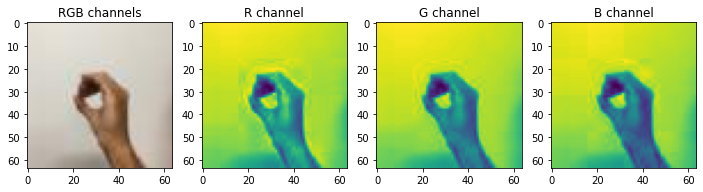



Image Name: Train1008.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 0. 1. 0. 0. 0.]
Predicted Class: 2
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 1.0, 0.721)


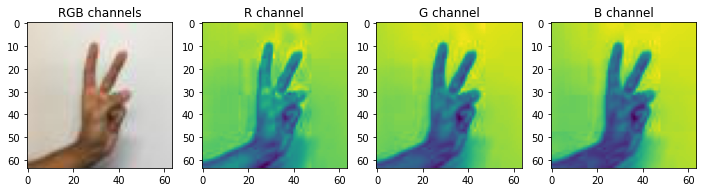



Image Name: Train440.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [0. 1. 0. 0. 0. 0.]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 0.973, 0.735)


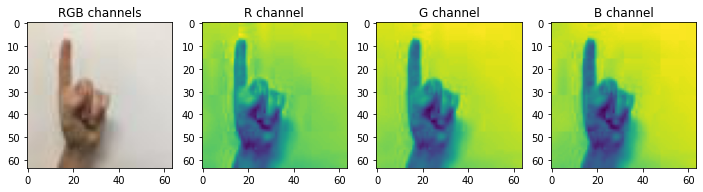

In [25]:
predictions = batch_predict_images(model=resnet50_v1_0, images=images, display=True)

In the previous example we saw that the system is working quite flawlessly while predicting the test figures as a batch. Let's try to repeat the same but this time predicting each image at the time.

In [26]:
def predict_image(model, image, display=True):
  predictions = []
  X_image, image_name = image

  predictions = model.predict(X_image)
  predictions = np.round(predictions, 3)

  if display:
    print(f"\033[1mImage Name: {image_name}\033[0m")
    print(f"Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = {predictions}")
    predicted_class = np.argmax(predictions)
    print(f"Predicted Class: {predicted_class}")
    display_images(images=X_image, index=[0], scale=False)

  return predictions

Image Name: Train573.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.001 0.985 0.011 0.    0.003 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.996, 0.731)


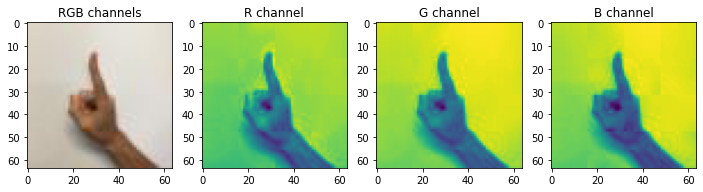



Image Name: Train955.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.022 0.103 0.705 0.    0.171 0.   ]]
Predicted Class: 2
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.941, 0.736)


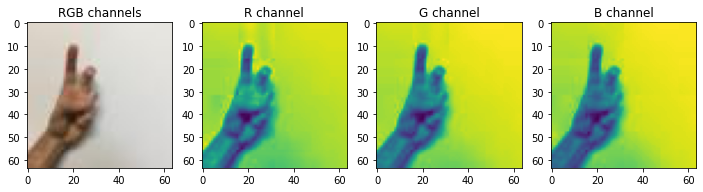



Image Name: Train161.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.998 0.    0.    0.    0.001 0.   ]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.031, 0.996, 0.713)


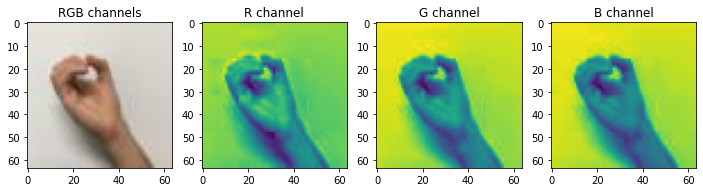



Image Name: Train511.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.005 0.018 0.007 0.    0.611 0.359]]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 1.0, 0.639)


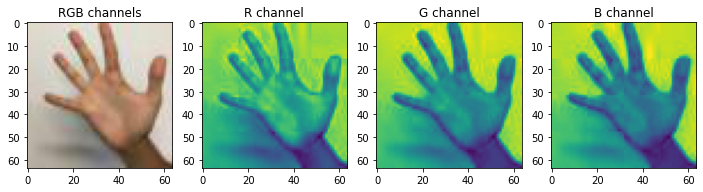



Image Name: Train231.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.965 0.006 0.002 0.    0.021 0.006]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.937, 0.74)


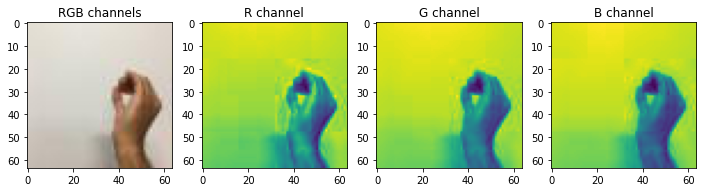



Image Name: Train309.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.005 0.003 0.002 0.    0.117 0.873]]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.075, 1.0, 0.685)


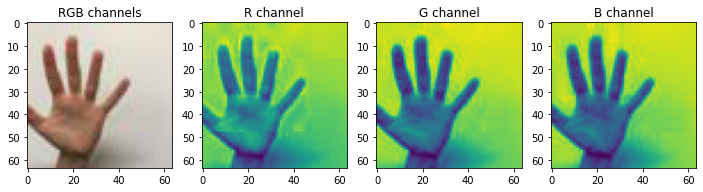



Image Name: Train1059.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.001 0.982 0.011 0.    0.006 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 0.992, 0.715)


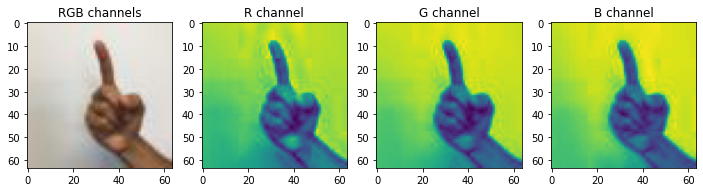



Image Name: Train821.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.999 0.    0.    0.    0.    0.   ]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.008, 0.945, 0.713)


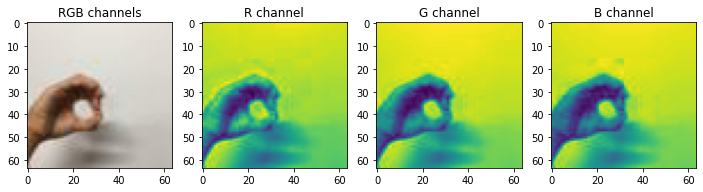



Image Name: Train61.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.467 0.041 0.035 0.    0.351 0.106]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.027, 1.0, 0.714)


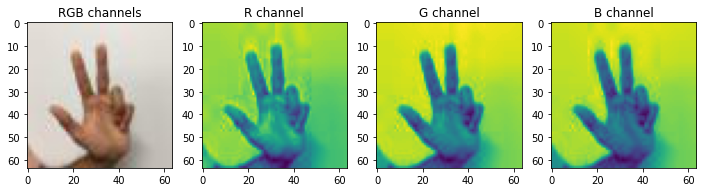



Image Name: Train800.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.994 0.    0.001 0.    0.005 0.   ]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 0.925, 0.708)


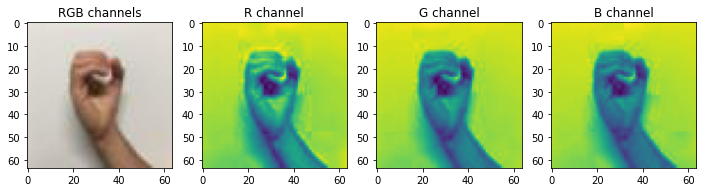



Image Name: Train984.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.008 0.005 0.006 0.    0.141 0.839]]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.027, 1.0, 0.696)


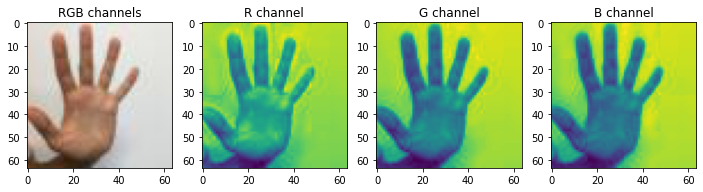



Image Name: Train183.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.026 0.082 0.008 0.    0.49  0.394]]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 1.0, 0.681)


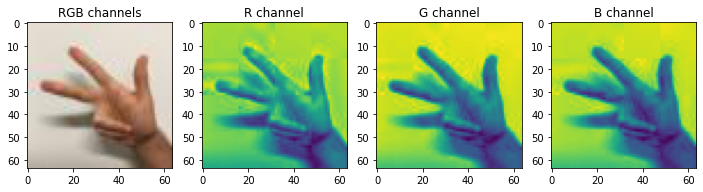



Image Name: Train447.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.025 0.133 0.009 0.    0.829 0.004]]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.008, 0.984, 0.672)


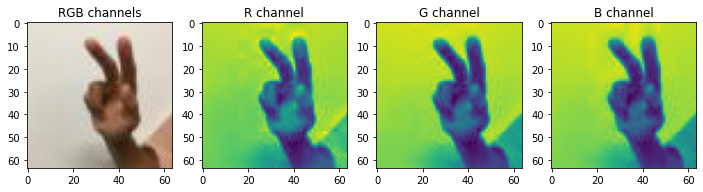



Image Name: Train190.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.002 0.034 0.007 0.    0.937 0.02 ]]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.09, 0.996, 0.719)


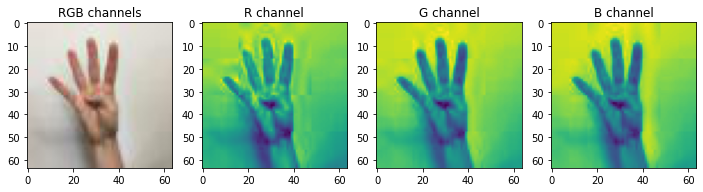



Image Name: Train715.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.    0.983 0.013 0.    0.004 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.055, 0.953, 0.739)


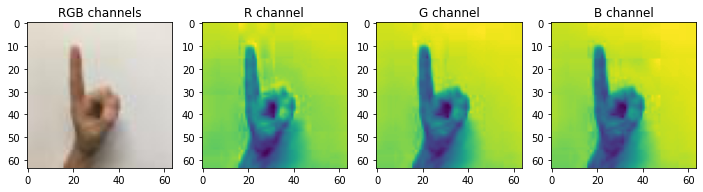



Image Name: Train1023.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.05  0.715 0.023 0.    0.168 0.045]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.059, 0.953, 0.728)


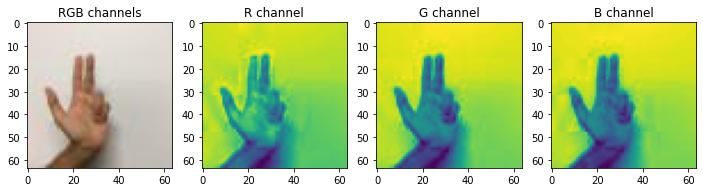



Image Name: Train212.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.016 0.02  0.005 0.    0.26  0.699]]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 0.992, 0.678)


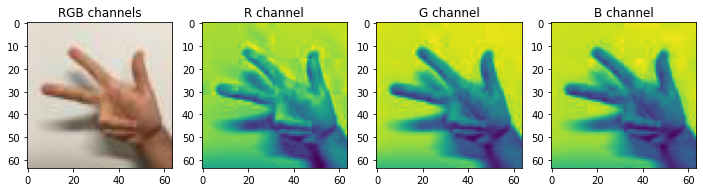



Image Name: Train985.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.998 0.    0.    0.    0.001 0.   ]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.91, 0.719)


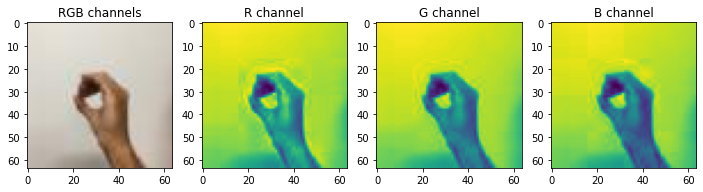



Image Name: Train1008.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.003 0.645 0.283 0.    0.069 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 1.0, 0.721)


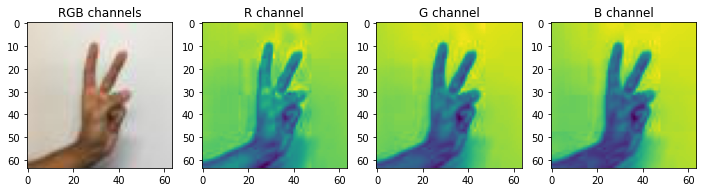



Image Name: Train440.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.001 0.964 0.023 0.    0.012 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 0.973, 0.735)


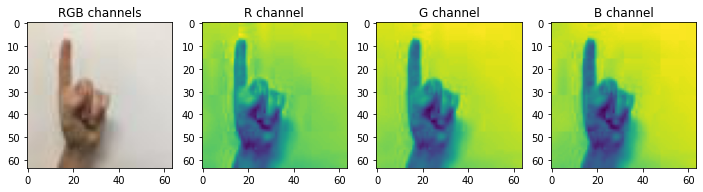

In [27]:
# Predicting a set of images one by one
for image in images:
  predictions = predict_image(model=resnet50_v1_0, image=image, display=True)

The first time I tried this, 11 out of 20 predicted wrong!!! And it gets worse every single time we run the prediction again!!
After spending a few hours debugging, reading documentation, and searching for clues in the net, I ended up understanding the following:


1.   Most of the blocks in the net include batch normalization
2.   Batch normalization during inference should in theory be calculated using constant STD and AVG learned from training
3.   In Keras this is done using moving averages based on the batches. This gets completely and rapidly out of sync after a few tries and therefore the model cannot perform well as the inputs are changing according to a completely different distribution
4.   I couldn't find a clever way to change this behavior. 

Finally, I caught that a single Batch Normalization was missing the parameter (training=True). This single layer in the definition of the entire model was ruining the predictions and this also explained the lack of reference of this problem in the web.

After fixing it, the prediction began working flawlessly.

In the next step we will create a prediction function. This function requires the input to be an iterator!





# 5 - Predict Function

In [28]:
predict_image_fn = resnet50_v1_0.make_predict_function(force=False)

def predict_image_by_fn(image, display=True):
  predictions = []
  X_image, image_name = image
  X_image = np.expand_dims(X_image, axis=0)

  predictions = predict_image_fn(iter(X_image))
  predictions = np.round(predictions, 3)

  if display:
    print(f"\033[1mImage Name: {image_name}\033[0m")
    print(f"Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = {predictions}")
    predicted_class = np.argmax(predictions)
    print(f"Predicted Class: {predicted_class}")
    display_images(images=np.squeeze(X_image, axis=0), index=[0], scale=False)

  return predictions

Image Name: Train573.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.001 0.985 0.011 0.    0.003 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.996, 0.731)


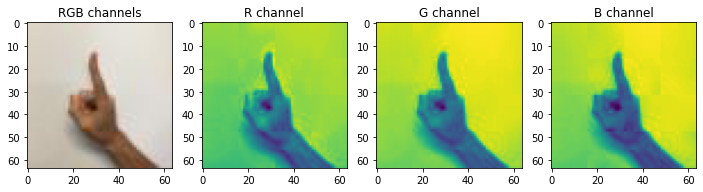



Image Name: Train955.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.022 0.103 0.705 0.    0.171 0.   ]]
Predicted Class: 2
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.941, 0.736)


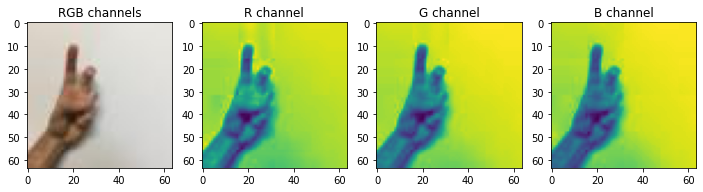



Image Name: Train161.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.998 0.    0.    0.    0.001 0.   ]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.031, 0.996, 0.713)


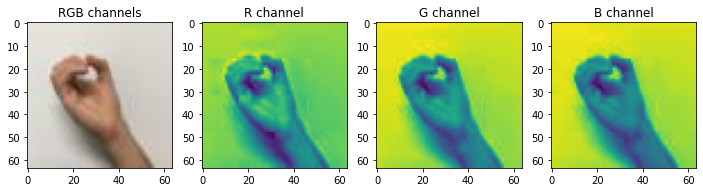



Image Name: Train511.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.005 0.018 0.007 0.    0.611 0.359]]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 1.0, 0.639)


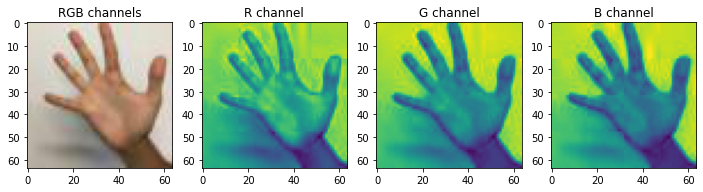



Image Name: Train231.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.965 0.006 0.002 0.    0.021 0.006]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.937, 0.74)


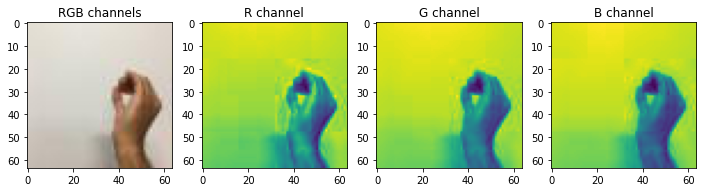



Image Name: Train309.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.005 0.003 0.002 0.    0.117 0.873]]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.075, 1.0, 0.685)


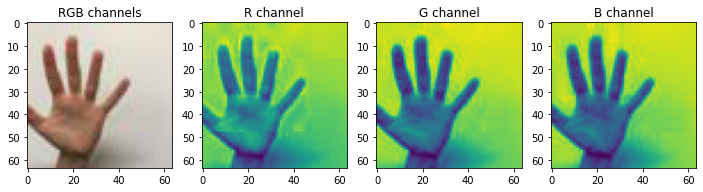



Image Name: Train1059.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.001 0.982 0.011 0.    0.006 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 0.992, 0.715)


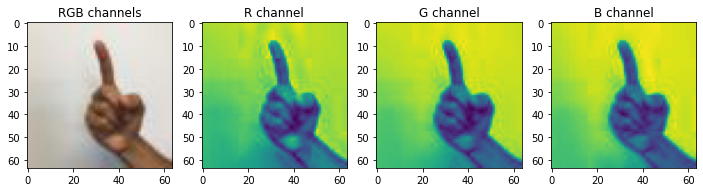



Image Name: Train821.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.999 0.    0.    0.    0.    0.   ]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.008, 0.945, 0.713)


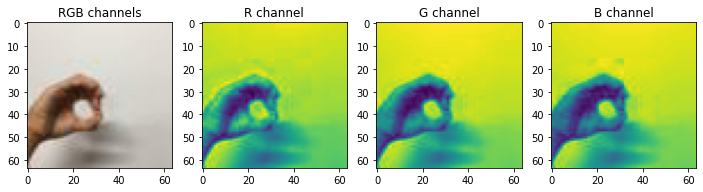



Image Name: Train61.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.467 0.041 0.035 0.    0.351 0.106]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.027, 1.0, 0.714)


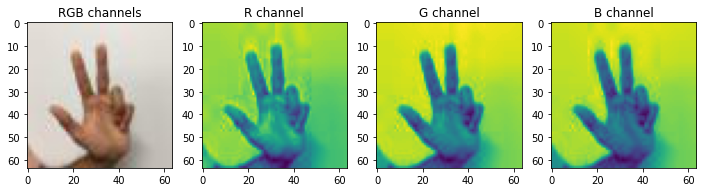



Image Name: Train800.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.994 0.    0.001 0.    0.005 0.   ]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 0.925, 0.708)


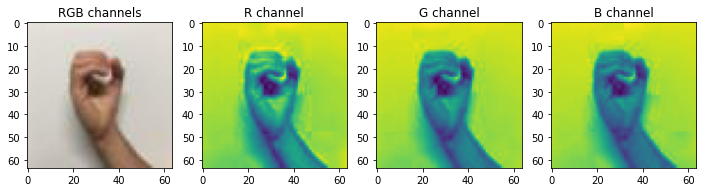



Image Name: Train984.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.008 0.005 0.006 0.    0.141 0.839]]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.027, 1.0, 0.696)


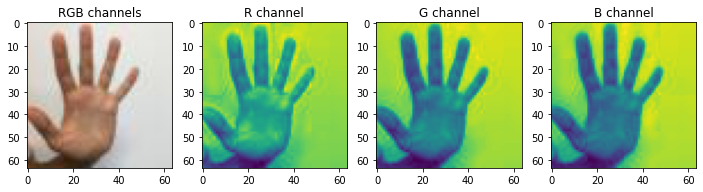



Image Name: Train183.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.026 0.082 0.008 0.    0.49  0.394]]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 1.0, 0.681)


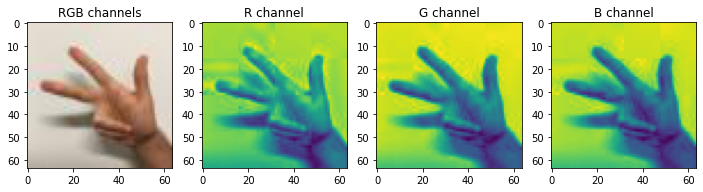



Image Name: Train447.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.025 0.133 0.009 0.    0.829 0.004]]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.008, 0.984, 0.672)


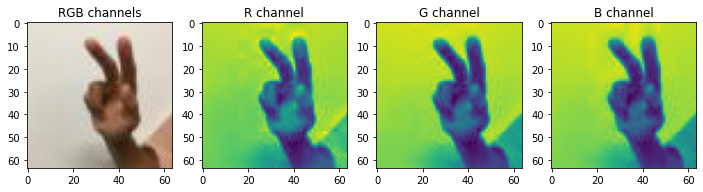



Image Name: Train190.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.002 0.034 0.007 0.    0.937 0.02 ]]
Predicted Class: 4
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.09, 0.996, 0.719)


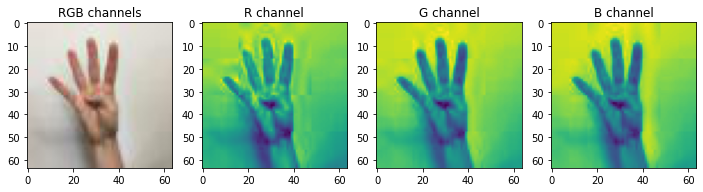



Image Name: Train715.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.    0.983 0.013 0.    0.004 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.055, 0.953, 0.739)


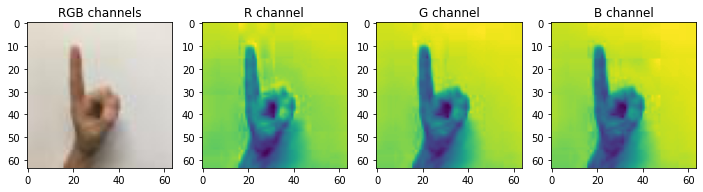



Image Name: Train1023.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.05  0.715 0.023 0.    0.168 0.045]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.059, 0.953, 0.728)


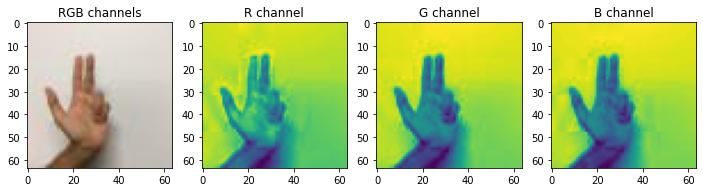



Image Name: Train212.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.016 0.02  0.005 0.    0.26  0.699]]
Predicted Class: 5
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 0.992, 0.678)


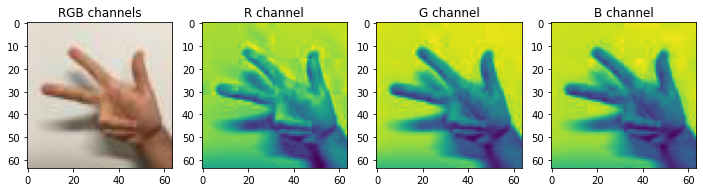



Image Name: Train985.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.998 0.    0.    0.    0.001 0.   ]]
Predicted Class: 0
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.0, 0.91, 0.719)


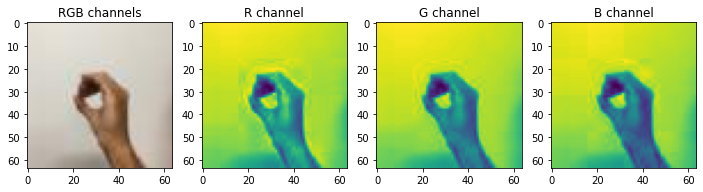



Image Name: Train1008.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.003 0.645 0.283 0.    0.069 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.016, 1.0, 0.721)


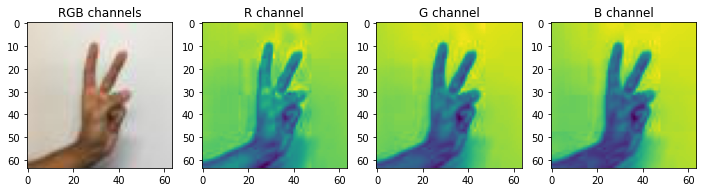



Image Name: Train440.JPG
Class prediction vector [p(0), p(1), p(2), p(3), p(4), p(5)] = [[0.001 0.964 0.023 0.    0.012 0.   ]]
Predicted Class: 1
Input no: 0 - image shape: (64, 64, 3) - (min, max, mean) = (0.067, 0.973, 0.735)


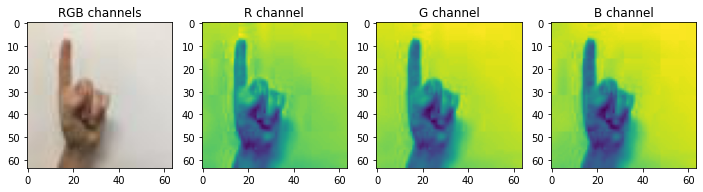

In [29]:
# Predicting a set of images one by one using the predict function
for image in images:
  predictions = predict_image_by_fn(image=image, display=True)

# 6 - Creating and Testing Networks with Different Sizes

Let's create a smaller and a larger resnet. Then, let's compare their performance on the test set.

In [30]:
def ResNet50_v2(input_shape = (64, 64, 3), classes = 6):
    """
    Stage-wise implementation of the architecture of the popular ResNet50 - Version 1.0:
    CONV2D -> BATCHNORM -> RELU -> MAXPOOL -> CONVBLOCK -> IDBLOCK*2 -> CONVBLOCK -> IDBLOCK*3
    -> CONVBLOCK -> IDBLOCK*5 -> CONVBLOCK -> IDBLOCK*2 -> AVGPOOL -> FLATTEN -> DENSE 

    Arguments:
    input_shape -- shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """
    
    # Define the input as a tensor with shape input_shape
    X_input = tfl.Input(input_shape)
 
    # Zero-Padding
    X = tfl.ZeroPadding2D((3, 3))(X_input)
    
    # Stage 1
    X = tfl.Conv2D(64, (7, 7), strides = (2, 2), kernel_initializer = tfi.glorot_uniform(seed=0))(X)
    X = tfl.BatchNormalization(axis = 3)(X, training=True)
    X = tfl.Activation('relu')(X)
    X = tfl.MaxPooling2D((3, 3), strides=(2, 2))(X)

    kernel_size = 3
    filters = [64, 64, 256, 512]
    stride_conv = 1

    # Stage 2
    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv)
    for i in range(4):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)
    
    ## Stage 3 
    filters = np.multiply(filters, 2)
    stride_conv = 2

    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv) 
    for i in range(6):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)  
    
    ## Stage 4 
    filters = np.multiply(filters, 2)

    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv)
    for i in range(10): 
      X = identity_block(X, kernel_size=kernel_size, filters=filters) 

    ## Stage 5 (≈3 lines)
    filters = np.multiply(filters, 2)
    
    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv) 
    for i in range(4):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)  

    X = tfl.AveragePooling2D(pool_size=(2, 2))(X) 

    # output layer
    X = tfl.Flatten()(X)
    X = tfl.Dense(classes, activation='softmax', kernel_initializer = tfi.glorot_uniform(seed=0))(X)
    
    # Create model
    model = tfm.Model(inputs = X_input, outputs = X)

    return model

In [31]:
resnet50_v2_0 = ResNet50_v2(input_shape = (64, 64, 3), classes = 6)
print(resnet50_v2_0.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 zero_padding2d_1 (ZeroPadding2  (None, 70, 70, 3)   0           ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv2d_53 (Conv2D)             (None, 32, 32, 64)   9472        ['zero_padding2d_1[0][0]']       
                                                                                                  
 batch_normalization_53 (BatchN  (None, 32, 32, 64)  256         ['conv2d_53[0][0]']        

In [32]:
resnet50_v2_0.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [33]:
resnet50_v2_0.fit(X_train, Y_train, epochs = 40, batch_size = 32)

Epoch 1/40
34/34 [==============================] - 25s 332ms/step - loss: 5.3017 - accuracy: 0.2074
Epoch 2/40
34/34 [==============================] - 10s 297ms/step - loss: 1.6721 - accuracy: 0.2667
Epoch 3/40
34/34 [==============================] - 10s 299ms/step - loss: 1.5858 - accuracy: 0.3296
Epoch 4/40
34/34 [==============================] - 10s 302ms/step - loss: 1.5758 - accuracy: 0.4824
Epoch 5/40
34/34 [==============================] - 10s 304ms/step - loss: 1.1745 - accuracy: 0.5991
Epoch 6/40
34/34 [==============================] - 10s 303ms/step - loss: 0.8077 - accuracy: 0.6611
Epoch 7/40
34/34 [==============================] - 10s 303ms/step - loss: 2.3415 - accuracy: 0.6685
Epoch 8/40
34/34 [==============================] - 10s 302ms/step - loss: 3.4217 - accuracy: 0.7093
Epoch 9/40
34/34 [==============================] - 10s 301ms/step - loss: 1.3516 - accuracy: 0.7722
Epoch 10/40
34/34 [==============================] - 10s 301ms/step - loss: 1.1589 - accura

In [34]:
_MODEL_FILENAME = 'Resnet50_v2_0.h5'
_MODEL_FULL_PATH = os.path.join(_MODELS_DIR, _MODEL_FILENAME)
print(f"Saving the model to disk as: {_MODEL_FULL_PATH} ...")
resnet50_v2_0.save(_MODEL_FULL_PATH, save_format='h5')

Saving the model to disk as: ./models/Resnet50_v2_0.h5 ...


In [35]:
def ResNet50_v3(input_shape = (64, 64, 3), classes = 6):
    """
    Stage-wise implementation of the architecture of the popular ResNet50 - Version 1.0:
    CONV2D -> BATCHNORM -> RELU -> MAXPOOL -> CONVBLOCK -> IDBLOCK*2 -> CONVBLOCK -> IDBLOCK*3
    -> CONVBLOCK -> IDBLOCK*5 -> CONVBLOCK -> IDBLOCK*2 -> AVGPOOL -> FLATTEN -> DENSE 

    Arguments:
    input_shape -- shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """
    
    # Define the input as a tensor with shape input_shape
    X_input = tfl.Input(input_shape)
 
    # Zero-Padding
    X = tfl.ZeroPadding2D((3, 3))(X_input)
    
    # Stage 1
    X = tfl.Conv2D(64, (7, 7), strides = (2, 2), kernel_initializer = tfi.glorot_uniform(seed=0))(X)
    X = tfl.BatchNormalization(axis = 3)(X, training=True)
    X = tfl.Activation('relu')(X)
    X = tfl.MaxPooling2D((3, 3), strides=(2, 2))(X)

    kernel_size = 3
    filters = [64, 64, 128]
    stride_conv = 1

    # Stage 2
    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv)
    for i in range(1):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)
    
    ## Stage 3 
    filters = np.multiply(filters, 2)
    stride_conv = 2

    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv) 
    for i in range(2):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)  
    
    ## Stage 4 
    filters = np.multiply(filters, 2)

    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv)
    for i in range(3): 
      X = identity_block(X, kernel_size=kernel_size, filters=filters) 

    ## Stage 5 (≈3 lines)
    filters = np.multiply(filters, 2)
    
    X = convolutional_block(X, kernel_size=kernel_size, filters=filters, stride=stride_conv) 
    for i in range(1):
      X = identity_block(X, kernel_size=kernel_size, filters=filters)  

    X = tfl.AveragePooling2D(pool_size=(2, 2))(X) 

    # output layer
    X = tfl.Flatten()(X)
    X = tfl.Dense(classes, activation='softmax', kernel_initializer = tfi.glorot_uniform(seed=0))(X)
    
    # Create model
    model = tfm.Model(inputs = X_input, outputs = X)

    return model

In [36]:
resnet50_v3_0 = ResNet50_v3(input_shape = (64, 64, 3), classes = 6)
print(resnet50_v3_0.summary())

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 70, 70, 3)   0           ['input_3[0][0]']                
 D)                                                                                               
                                                                                                  
 conv2d_170 (Conv2D)            (None, 32, 32, 64)   9472        ['zero_padding2d_2[0][0]']       
                                                                                                  
 batch_normalization_170 (Batch  (None, 32, 32, 64)  256         ['conv2d_170[0][0]']       

In [37]:
resnet50_v3_0.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [38]:
resnet50_v3_0.fit(X_train, Y_train, epochs = 40, batch_size = 32)

Epoch 1/40
34/34 [==============================] - 6s 44ms/step - loss: 1.2232 - accuracy: 0.5704
Epoch 2/40
34/34 [==============================] - 1s 31ms/step - loss: 0.4352 - accuracy: 0.8407
Epoch 3/40
34/34 [==============================] - 1s 31ms/step - loss: 0.2272 - accuracy: 0.9204
Epoch 4/40
34/34 [==============================] - 1s 31ms/step - loss: 0.1936 - accuracy: 0.9481
Epoch 5/40
34/34 [==============================] - 1s 31ms/step - loss: 0.1847 - accuracy: 0.9444
Epoch 6/40
34/34 [==============================] - 1s 31ms/step - loss: 0.1208 - accuracy: 0.9611
Epoch 7/40
34/34 [==============================] - 1s 31ms/step - loss: 0.2680 - accuracy: 0.9074
Epoch 8/40
34/34 [==============================] - 1s 31ms/step - loss: 0.1722 - accuracy: 0.9426
Epoch 9/40
34/34 [==============================] - 1s 31ms/step - loss: 0.0762 - accuracy: 0.9741
Epoch 10/40
34/34 [==============================] - 1s 31ms/step - loss: 0.0846 - accuracy: 0.9741
Epoch 11/

In [39]:
_MODEL_FILENAME = 'Resnet50_v3_0.h5'
_MODEL_FULL_PATH = os.path.join(_MODELS_DIR, _MODEL_FILENAME)
print(f"Saving the model to disk as: {_MODEL_FULL_PATH} ...")
resnet50_v3_0.save(_MODEL_FULL_PATH, save_format='h5')

Saving the model to disk as: ./models/Resnet50_v3_0.h5 ...


Let's check the performance of each one of those models on the test set.

In [40]:
def calculate_confusion_matrix(model, X_test, Y_test):
  Y_pred = model.predict(X_test)
  matrix = tf.math.confusion_matrix(Y_test.argmax(axis=1), Y_pred.argmax(axis=1))
  matrix_df = pd.DataFrame(matrix.numpy(), columns=['Pred_'+str(i) for i in range(6)], index=['Real_'+str(i) for i in range(6)])

  return matrix_df

In [41]:
print ('\033[1mConfusion Matrix for resnet50_v1_0\033[0m')
calculate_confusion_matrix(resnet50_v1_0, X_test, Y_test)

print ('\n\033[1mConfusion Matrix for resnet50_v2_0\033[0m')
calculate_confusion_matrix(resnet50_v2_0, X_test, Y_test)

print ('\n\033[1mConfusion Matrix for resnet50_v3_0\033[0m')
calculate_confusion_matrix(resnet50_v3_0, X_test, Y_test)

Confusion Matrix for resnet50_v1_0


,Pred_0,Pred_1,Pred_2,Pred_3,Pred_4,Pred_5
Real_0,20,0,0,0,0,0
Real_1,0,20,0,0,0,0
Real_2,0,1,19,0,0,0
Real_3,0,0,0,20,0,0
Real_4,0,0,0,1,18,1
Real_5,0,0,0,0,0,20



Confusion Matrix for resnet50_v2_0


,Pred_0,Pred_1,Pred_2,Pred_3,Pred_4,Pred_5
Real_0,19,0,0,0,1,0
Real_1,1,16,0,3,0,0
Real_2,1,3,15,0,1,0
Real_3,0,0,0,20,0,0
Real_4,3,0,0,2,14,1
Real_5,0,0,0,0,0,20



Confusion Matrix for resnet50_v3_0


,Pred_0,Pred_1,Pred_2,Pred_3,Pred_4,Pred_5
Real_0,20,0,0,0,0,0
Real_1,0,20,0,0,0,0
Real_2,0,2,18,0,0,0
Real_3,0,0,0,20,0,0
Real_4,0,0,0,3,17,0
Real_5,0,0,0,1,0,19


Big WOW! The original network performed quite fine; the complex one gets  overfitted, while the last one still performs quite decently.

Another proof that bigger is not necessarily more accurate! :-)

# 7 - Bibliography

This notebook presents the ResNet algorithm from He et al. (2015). The implementation here also took significant inspiration and follows the structure given in the GitHub repository of Francois Chollet: 

- Kaiming He, Xiangyu Zhang, Shaoqing Ren, Jian Sun - [Deep Residual Learning for Image Recognition (2015)](https://arxiv.org/abs/1512.03385)
- Francois Chollet's GitHub repository: https://github.com/fchollet/deep-learning-models/blob/master/resnet50.py
